In [ ]:
import time
start_time = time.time()

In [ ]:
!nvidia-smi

Wed Jun 18 05:46:56 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   30C    P0             45W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
import kagglehub
from pathlib import Path
import os

# 1. Download (or locate) the dataset
dataset_handle = "kenpachi99/cte-divoire-byte-sized-agriculture-data"
primary_path = Path(kagglehub.dataset_download(dataset_handle))

# 2. Prepare both candidate locations
alt_path = Path("/kaggle/input") / dataset_handle.split("/")[-1]

# 3. Pick the first path that actually exists
for candidate in (primary_path, alt_path):
    if candidate.exists():
        DATA_DIR = candidate
        break
else:
    raise FileNotFoundError(f"Dataset not found in either {primary_path} or {alt_path}")

os.environ["BYTE_DATA_DIR"] = str(DATA_DIR)
print("Data source import complete.")
print(DATA_DIR)
os.listdir(DATA_DIR)


Data source import complete.
/kaggle/input/cte-divoire-byte-sized-agriculture-data


['trainGeo.geojson',
 'TrainDataset.csv',
 'trainGeo',
 'SampleSubmission.csv',
 'ByteSizedAgriStarterBook.ipynb',
 'TestDataset.csv',
 'S2Images']

In [ ]:
%%capture
!pip install rasterio spyndex lightgbm albumentations pytorch_lightning python-box

In [ ]:
import multiprocessing
multiprocessing.cpu_count()

12

In [ ]:
%%writefile feature_engineering.py
import logging
import os
import warnings
from pathlib import Path

import multiprocessing
import numpy as np
import pandas as pd
import rasterio
import spyndex
from joblib import Parallel, delayed
from scipy.stats import kurtosis, skew
from tqdm.auto import tqdm
import shutil
from collections import defaultdict

# --- Configuration ---
N_JOBS = multiprocessing.cpu_count()
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OPENBLAS_NUM_THREADS"] = "1"

# --- Setup Logging and Paths ---
logging.basicConfig(
    level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s"
)
warnings.filterwarnings("ignore", category=RuntimeWarning)

ROOT_DIR = Path.cwd()

# Read DATA_DIR from environment variable
DATA_DIR = Path(os.environ["BYTE_DATA_DIR"])
# DATA_DIR = Path('/kaggle/input/cte-divoire-byte-sized-agriculture-data')
S2_DIR = DATA_DIR / "S2Images"
OUTPUT_DIR = ROOT_DIR / "processed_outputs"
OUTPUT_DIR.mkdir(exist_ok=True)


train = pd.read_csv(DATA_DIR / "TrainDataset.csv")
test = pd.read_csv(DATA_DIR / "TestDataset.csv")
df = pd.concat(
    [train.assign(dstype="train"), test.assign(dstype="test")],
    axis=0,
    ignore_index=True,
)
df["ID"] = df.ID.apply(lambda x: "_".join(x.split("_")[:-1]))
df = df.dropna(subset=["tifPath"]).reset_index(drop=True)
df["month"] = df["tifPath"].apply(lambda x: int(Path(x).stem.split("_")[-1]))

s2_df = pd.Series(list(S2_DIR.glob("**/*.tif"))).to_frame(name="tif_path")
s2_df["dstype"] = s2_df["tif_path"].apply(lambda x: x.parts[-2])
s2_df["ID"] = s2_df["tif_path"].apply(lambda x: "_".join(x.stem.split("_")[2:4]))
s2_df["month"] = s2_df["tif_path"].apply(lambda x: int(x.stem.split("_")[-1]))
s2_df = s2_df.sort_values(by=["ID", "month"]).reset_index(drop=True)
df = s2_df.merge(
    df[["ID", "month", "dstype", "Target"]],
    on=["ID", "month", "dstype"],
    how="left",
)

# --- Worker Functions for Parallel Processing ---
def process_tif_file(file_path):
    """
    Reads a single GeoTIFF file.
    Returns a tuple: (pixel_dataframe, metadata_dict).
    The metadata_dict contains the image dimensions (H, W).
    """
    try:
        with rasterio.open(file_path) as src:
            if src.count != 12:
                logging.warning(
                    f"Expected 12 bands but got {src.count} in {file_path}. Skipping."
                )
                return None

            H, W = src.height, src.width
            data = src.read().astype(np.float32)
            data = data.reshape(12, -1).T
            valid_pixels_mask = ~np.all(data == 0, axis=1)
            data = data[valid_pixels_mask]

            if data.shape[0] == 0:
                return None

            df_tmp = pd.DataFrame(data, columns=[f"B{i}" for i in range(1, 13)])

            # Extract metadata from file path
            parts = file_path.stem.split("_")
            image_id = "_".join(parts[2:4])
            month = int(parts[-1])

            df_tmp["ID"] = image_id
            df_tmp["month"] = month

            # Create a separate dictionary for image dimensions
            meta_info = {"ID": image_id, "month": month, "height": H, "width": W}

            return df_tmp, meta_info

    except Exception as e:
        logging.error(f"Error processing {file_path}: {e}")
        return None


def summarize_id_stats(group_tuple, bands, q=(25, 75)):
    """
    Worker function to calculate statistics for ALL months for a SINGLE ID.
    This produces one final feature row per ID.
    """
    target_id, id_df = group_tuple
    stats = {}

    for month, month_group in id_df.groupby("month"):
        for band in bands:
            pixels = month_group[band].values
            finite_pixels = pixels[np.isfinite(pixels)]

            if finite_pixels.size == 0:
                (mn, md, mn_, mx_, ku, sk, q25, q75) = (np.nan,) * 8
            else:
                mn, md, mn_, mx_ = (
                    np.mean(finite_pixels),
                    np.median(finite_pixels),
                    np.min(finite_pixels),
                    np.max(finite_pixels),
                )
                ku, sk = kurtosis(finite_pixels), skew(finite_pixels)
                q25, q75 = np.percentile(finite_pixels, q[0]), np.percentile(
                    finite_pixels, q[1]
                )

            stats.update(
                {
                    f"{band}_mean_month{month}": mn,
                    f"{band}_median_month{month}": md,
                    f"{band}_min_month{month}": mn_,
                    f"{band}_max_month{month}": mx_,
                    f"{band}_kurtosis_month{month}": ku,
                    f"{band}_skew_month{month}": sk,
                    f"{band}_q25_month{month}": q25,
                    f"{band}_q75_month{month}": q75,
                }
            )

    stats["ID"] = target_id
    return stats


def main():
    """Main execution script."""

    logging.info("--- Starting Data Processing ---")

    # --- 1. PARALLEL PIXEL EXTRACTION ---
    all_tif_files = list(S2_DIR.glob("**/*.tif"))
    if not all_tif_files:
        logging.error(f"No .tif files found in {S2_DIR}. Exiting.")
        return
    logging.info(
        f"Step 1: Found {len(all_tif_files)} TIF files. Starting pixel extraction with {N_JOBS} jobs..."
    )

    with Parallel(n_jobs=N_JOBS) as parallel:
        # This will return a list of tuples: [(df1, meta1), (df2, meta2), None, ...]
        results = parallel(
            delayed(process_tif_file)(f)
            for f in tqdm(all_tif_files, desc="Reading TIFs")
        )

    # Filter out None results and unpack into separate lists
    valid_results = [res for res in results if res is not None]
    if not valid_results:
        logging.error("No pixel data could be extracted. Exiting.")
        return

    pxdf_list = [res[0] for res in valid_results]
    meta_list = [res[1] for res in valid_results]

    # Create and save the main pixel dataframe
    pxdf = pd.concat(pxdf_list, ignore_index=True)
    logging.info(f"Pixel extraction complete. Shape of pxdf: {pxdf.shape}")
    pxdf.to_csv(OUTPUT_DIR / "pxdf.csv", index=False)
    logging.info(f"Saved raw pixel data to {OUTPUT_DIR / 'pxdf.csv'}")

    # Create and save the image metadata dataframe
    image_meta_df = pd.DataFrame(meta_list)
    image_meta_df.drop_duplicates(inplace=True)
    logging.info(f"Image metadata collected. Shape of meta_df: {image_meta_df.shape}")
    image_meta_df.to_csv(OUTPUT_DIR / "image_meta.csv", index=False)
    logging.info(f"Saved image metadata (H, W) to {OUTPUT_DIR / 'image_meta.csv'}")

    # --- 2. BAND STATISTICS AGGREGATION ---
    logging.info(f"Step 2: Aggregating band statistics with {N_JOBS} jobs...")

    bands = [f"B{i}" for i in range(1, 13)]
    id_groups = pxdf.groupby("ID")

    with Parallel(n_jobs=N_JOBS, verbose=10) as parallel:
        stats_list = parallel(
            delayed(summarize_id_stats)(group, bands=bands)
            for group in tqdm(
                id_groups, desc="Aggregating Band Stats", total=len(id_groups)
            )
        )

    agg_df = pd.DataFrame(stats_list).set_index("ID")
    logging.info(f"Band statistics aggregated. Shape of agg_df: {agg_df.shape}")
    agg_df.to_csv(OUTPUT_DIR / "agg_df.csv")
    logging.info(f"Saved aggregated band data to {OUTPUT_DIR / 'agg_df.csv'}")

    # --- 3. VEGETATION INDICES (VI) CALCULATION & AGGREGATION ---
    logging.info("Step 3: Calculating and Aggregating Vegetation Indices (VIs)...")

    band_code_map = {
        "B2": "B",
        "B3": "G",
        "B4": "R",
        "B5": "RE1",
        "B6": "RE2",
        "B7": "RE3",
        "B8": "N",
        "B11": "SWIR1",
        "B12": "SWIR2",
    }
    pxdf_vi = pxdf.rename(columns=band_code_map)
    del pxdf  # Free up memory

    available_bands = set(pxdf_vi.columns)
    compatible_indices = [
        idx
        for idx in spyndex.indices
        if set(spyndex.indices[idx].bands).issubset(available_bands)
    ]
    logging.info(f"Found {len(compatible_indices)} compatible VIs.")

    if not compatible_indices:
        logging.warning("No compatible VIs found. Skipping VI feature generation.")
    else:
        vi_df_computed = spyndex.computeIndex(index=compatible_indices, params=pxdf_vi)
        vi_df = pd.concat([pxdf_vi[["ID", "month"]], vi_df_computed], axis=1)
        del pxdf_vi, vi_df_computed

        logging.info(f"Aggregating VI statistics with {N_JOBS} jobs...")
        vi_id_groups = vi_df.groupby("ID")

        with Parallel(n_jobs=N_JOBS, verbose=10) as parallel:
            vi_stats_list = parallel(
                delayed(summarize_id_stats)(group, bands=compatible_indices)
                for group in tqdm(
                    vi_id_groups, desc="Aggregating VI Stats", total=len(vi_id_groups)
                )
            )

        vi_agg_df = pd.DataFrame(vi_stats_list).set_index("ID")
        logging.info(f"VI statistics aggregated. Shape of vi_df: {vi_agg_df.shape}")
        vi_agg_df.to_csv(OUTPUT_DIR / "vi_agg_df.csv")
        logging.info(f"Saved aggregated VI data to {OUTPUT_DIR / 'vi_df.csv'}")

    logging.info("--- Creating npy images from tiff files ---")

    NPY_IMAGES_DIR = ROOT_DIR / "npy_images"
    if NPY_IMAGES_DIR.exists():
        shutil.rmtree(NPY_IMAGES_DIR)
    NPY_IMAGES_DIR.mkdir(parents=True, exist_ok=True)


    records = defaultdict(list)
    for row in tqdm(s2_df.itertuples(), total=len(s2_df)):
        tif_path = row.tif_path
        npy_path = NPY_IMAGES_DIR / f"{row.ID}_{row.month}.npy"

        records["npy_path"].append(npy_path)
        records["ID"].append(row.ID)
        records["month"].append(row.month)
        records["dstype"].append(row.dstype)

        if not npy_path.exists():
            with rasterio.open(tif_path) as src:
                # Read all bands into a numpy array of shape (bands, height, width)
                all_bands = src.read()  # shape: (num_bands, H, W)
                h, w = all_bands.shape[1], all_bands.shape[2]
                records["height"].append(h)
                records["width"].append(w)
                np.save(npy_path, all_bands)

    s2_npy_df = pd.DataFrame(records)
    s2_npy_df = s2_npy_df.sort_values(by=["ID", "month"]).reset_index(drop=True)

    s2_npy_df = s2_npy_df.merge(
        df[["ID", "month", "dstype", "Target"]], on=["ID", "month", "dstype"], how="left"
    )
    s2_npy_df["ID2"] = [f"{x}_{y}" for x, y in zip(s2_npy_df["ID"], s2_npy_df["month"])]
    s2_npy_df.to_csv(OUTPUT_DIR / "s2_npy_df.csv", index=False)
    df.to_csv(OUTPUT_DIR / "df.csv", index=False)

    logging.info("--- Script finished successfully ---")


if __name__ == "__main__":
    main()


Writing feature_engineering.py


In [ ]:
%%time
!python feature_engineering.py

2025-06-18 05:48:45,499 - INFO - --- Starting Data Processing ---
2025-06-18 05:48:52,211 - INFO - Step 1: Found 9634 TIF files. Starting pixel extraction with 12 jobs...
Reading TIFs: 100% 9634/9634 [00:26<00:00, 360.10it/s]
2025-06-18 05:49:20,713 - INFO - Pixel extraction complete. Shape of pxdf: (31596933, 14)
2025-06-18 05:53:46,151 - INFO - Saved raw pixel data to /content/processed_outputs/pxdf.csv
2025-06-18 05:53:46,170 - INFO - Image metadata collected. Shape of meta_df: (9634, 4)
2025-06-18 05:53:46,183 - INFO - Saved image metadata (H, W) to /content/processed_outputs/image_meta.csv
2025-06-18 05:53:46,183 - INFO - Step 2: Aggregating band statistics with 12 jobs...
Aggregating Band Stats:   0% 0/1235 [00:00<?, ?it/s][Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
Aggregating Band Stats:   0% 1/1235 [00:01<33:40,  1.64s/it][Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    2.5s
Aggregating Band Stats:   2% 24/1235 [00:02<01:43, 11.68it/s][

In [ ]:
import logging
import warnings
from pathlib import Path

import albumentations as A
import cv2
import lightgbm as lgb
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pytorch_lightning as pl
import seaborn as sns
import timm
import torch
import torch.nn as nn
import torch.nn.functional as F
from albumentations.pytorch import ToTensorV2
from scipy.stats import entropy
from sklearn.metrics import f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import DataLoader, Dataset
from torchmetrics.classification import MulticlassF1Score
from torch.optim import AdamW
from box import Box
import random

warnings.filterwarnings("ignore")

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
pd.set_option("display.float_format", lambda x: "%.3f" % x)
pd.set_option("display.precision", 3)
pd.set_option("display.expand_frame_repr", False)
pd.set_option("display.max_colwidth", 200)

In [ ]:
ROOT_DIR = Path.cwd()
PROCESSED_OUTPUTS_DIR = ROOT_DIR / "processed_outputs"

df = pd.read_csv(PROCESSED_OUTPUTS_DIR / "df.csv")
vi_df = pd.read_csv(PROCESSED_OUTPUTS_DIR / "vi_agg_df.csv")
agg_df = pd.read_csv(PROCESSED_OUTPUTS_DIR / "agg_df.csv")
s2_npy_df = pd.read_csv(PROCESSED_OUTPUTS_DIR / "s2_npy_df.csv")
px_df = pd.read_csv(PROCESSED_OUTPUTS_DIR / "pxdf.csv")
image_meta_df = pd.read_csv(PROCESSED_OUTPUTS_DIR / "image_meta.csv")
ss = pd.read_csv(DATA_DIR / 'SampleSubmission.csv')
df.head()

,tif_path,dstype,ID,month,Target
0,/kaggle/input/cte-divoire-byte-sized-agriculture-data/S2Images/S2Images/test/s2_Unknown_ID_000167_2024_01.tif,test,ID_000167,1,NaN
1,/kaggle/input/cte-divoire-byte-sized-agriculture-data/S2Images/S2Images/test/s2_Unknown_ID_000167_2024_02.tif,test,ID_000167,2,NaN
2,/kaggle/input/cte-divoire-byte-sized-agriculture-data/S2Images/S2Images/test/s2_Unknown_ID_000167_2024_03.tif,test,ID_000167,3,NaN
3,/kaggle/input/cte-divoire-byte-sized-agriculture-data/S2Images/S2Images/test/s2_Unknown_ID_000167_2024_04.tif,test,ID_000167,4,NaN
4,/kaggle/input/cte-divoire-byte-sized-agriculture-data/S2Images/S2Images/test/s2_Unknown_ID_000167_2024_07.tif,test,ID_000167,7,NaN


In [ ]:
px_df.head()

,B1,B2,B3,B4,B5,B6,B7,B8,B9,B10,B11,B12,ID,month
0,2394.000,2102.000,1969.000,1683.000,1993.000,3217.000,3827.000,3729.000,4241.000,1453.000,3134.000,1965.000,ID_142344,7
1,2394.000,2075.000,1921.000,1653.000,1893.000,3198.000,3786.000,3528.000,4060.000,1453.000,2962.000,1860.000,ID_142344,7
2,2394.000,2055.000,1879.000,1615.000,1893.000,3198.000,3786.000,3549.000,4060.000,1453.000,2962.000,1860.000,ID_142344,7
3,2459.000,2051.000,1906.000,1605.000,1884.000,3358.000,4015.000,3902.000,4450.000,1468.000,2934.000,1788.000,ID_142344,7
4,2459.000,2041.000,1913.000,1602.000,1884.000,3358.000,4015.000,4039.000,4450.000,1468.000,2934.000,1788.000,ID_142344,7


In [ ]:
agg_df.head()

,ID,B1_mean_month1,B1_median_month1,B1_min_month1,B1_max_month1,B1_kurtosis_month1,B1_skew_month1,B1_q25_month1,B1_q75_month1,B2_mean_month1,B2_median_month1,B2_min_month1,B2_max_month1,B2_kurtosis_month1,B2_skew_month1,B2_q25_month1,B2_q75_month1,B3_mean_month1,B3_median_month1,B3_min_month1,B3_max_month1,B3_kurtosis_month1,B3_skew_month1,B3_q25_month1,B3_q75_month1,B4_mean_month1,B4_median_month1,B4_min_month1,B4_max_month1,B4_kurtosis_month1,B4_skew_month1,B4_q25_month1,B4_q75_month1,B5_mean_month1,B5_median_month1,B5_min_month1,B5_max_month1,B5_kurtosis_month1,B5_skew_month1,B5_q25_month1,B5_q75_month1,B6_mean_month1,B6_median_month1,B6_min_month1,B6_max_month1,B6_kurtosis_month1,B6_skew_month1,B6_q25_month1,B6_q75_month1,B7_mean_month1,B7_median_month1,B7_min_month1,B7_max_month1,B7_kurtosis_month1,B7_skew_month1,B7_q25_month1,B7_q75_month1,B8_mean_month1,B8_median_month1,B8_min_month1,B8_max_month1,B8_kurtosis_month1,B8_skew_month1,B8_q25_month1,B8_q75_month1,B9_mean_month1,B9_median_month1,B9_min_month1,B9_max_month1,B9_kurtosis_month1,B9_skew_month1,B9_q25_month1,B9_q75_month1,B10_mean_month1,B10_median_month1,B10_min_month1,B10_max_month1,B10_kurtosis_month1,B10_skew_month1,B10_q25_month1,B10_q75_month1,B11_mean_month1,B11_median_month1,B11_min_month1,B11_max_month1,B11_kurtosis_month1,B11_skew_month1,B11_q25_month1,B11_q75_month1,B12_mean_month1,B12_median_month1,B12_min_month1,B12_max_month1,B12_kurtosis_month1,B12_skew_month1,B12_q25_month1,B12_q75_month1,B1_mean_month2,B1_median_month2,B1_min_month2,B1_max_month2,B1_kurtosis_month2,B1_skew_month2,B1_q25_month2,B1_q75_month2,B2_mean_month2,B2_median_month2,B2_min_month2,B2_max_month2,B2_kurtosis_month2,B2_skew_month2,B2_q25_month2,B2_q75_month2,B3_mean_month2,B3_median_month2,B3_min_month2,B3_max_month2,B3_kurtosis_month2,B3_skew_month2,B3_q25_month2,B3_q75_month2,B4_mean_month2,B4_median_month2,B4_min_month2,B4_max_month2,B4_kurtosis_month2,B4_skew_month2,B4_q25_month2,B4_q75_month2,B5_mean_month2,B5_median_month2,B5_min_month2,B5_max_month2,B5_kurtosis_month2,B5_skew_month2,B5_q25_month2,B5_q75_month2,B6_mean_month2,B6_median_month2,B6_min_month2,B6_max_month2,B6_kurtosis_month2,B6_skew_month2,B6_q25_month2,B6_q75_month2,B7_mean_month2,B7_median_month2,B7_min_month2,B7_max_month2,B7_kurtosis_month2,B7_skew_month2,B7_q25_month2,B7_q75_month2,B8_mean_month2,B8_median_month2,B8_min_month2,B8_max_month2,B8_kurtosis_month2,B8_skew_month2,B8_q25_month2,B8_q75_month2,B9_mean_month2,B9_median_month2,B9_min_month2,B9_max_month2,B9_kurtosis_month2,B9_skew_month2,B9_q25_month2,B9_q75_month2,B10_mean_month2,B10_median_month2,B10_min_month2,B10_max_month2,B10_kurtosis_month2,B10_skew_month2,B10_q25_month2,B10_q75_month2,B11_mean_month2,B11_median_month2,B11_min_month2,B11_max_month2,B11_kurtosis_month2,B11_skew_month2,B11_q25_month2,B11_q75_month2,B12_mean_month2,B12_median_month2,B12_min_month2,B12_max_month2,B12_kurtosis_month2,B12_skew_month2,B12_q25_month2,B12_q75_month2,B1_mean_month3,B1_median_month3,B1_min_month3,B1_max_month3,B1_kurtosis_month3,B1_skew_month3,B1_q25_month3,B1_q75_month3,B2_mean_month3,B2_median_month3,B2_min_month3,B2_max_month3,B2_kurtosis_month3,B2_skew_month3,B2_q25_month3,B2_q75_month3,B3_mean_month3,B3_median_month3,B3_min_month3,B3_max_month3,B3_kurtosis_month3,B3_skew_month3,B3_q25_month3,B3_q75_month3,B4_mean_month3,B4_median_month3,B4_min_month3,B4_max_month3,B4_kurtosis_month3,B4_skew_month3,B4_q25_month3,B4_q75_month3,B5_mean_month3,B5_median_month3,B5_min_month3,B5_max_month3,B5_kurtosis_month3,B5_skew_month3,B5_q25_month3,B5_q75_month3,B6_mean_month3,B6_median_month3,B6_min_month3,B6_max_month3,B6_kurtosis_month3,B6_skew_month3,B6_q25_month3,B6_q75_month3,B7_mean_month3,B7_median_month3,B7_min_month3,B7_max_month3,B7_kurtosis_month3,B7_skew_month3,B7_q25_month3,B7_q75_month3,B8_mean_month3,B8_median_month3,B8_min_month3,B8_max_month3,B8_kurtosis_month3,B8_skew_month3,B8_q25_month3,B8_q75_month3,B9_mean_month3,B9_median_month3,B9_min_month

In [ ]:
vi_df.head()

,ID,ARI_mean_month1,ARI_median_month1,ARI_min_month1,ARI_max_month1,ARI_kurtosis_month1,ARI_skew_month1,ARI_q25_month1,ARI_q75_month1,ARI2_mean_month1,ARI2_median_month1,ARI2_min_month1,ARI2_max_month1,ARI2_kurtosis_month1,ARI2_skew_month1,ARI2_q25_month1,ARI2_q75_month1,AVI_mean_month1,AVI_median_month1,AVI_min_month1,AVI_max_month1,AVI_kurtosis_month1,AVI_skew_month1,AVI_q25_month1,AVI_q75_month1,BAI_mean_month1,BAI_median_month1,BAI_min_month1,BAI_max_month1,BAI_kurtosis_month1,BAI_skew_month1,BAI_q25_month1,BAI_q75_month1,BCC_mean_month1,BCC_median_month1,BCC_min_month1,BCC_max_month1,BCC_kurtosis_month1,BCC_skew_month1,BCC_q25_month1,BCC_q75_month1,BITM_mean_month1,BITM_median_month1,BITM_min_month1,BITM_max_month1,BITM_kurtosis_month1,BITM_skew_month1,BITM_q25_month1,BITM_q75_month1,BIXS_mean_month1,BIXS_median_month1,BIXS_min_month1,BIXS_max_month1,BIXS_kurtosis_month1,BIXS_skew_month1,BIXS_q25_month1,BIXS_q75_month1,BNDVI_mean_month1,BNDVI_median_month1,BNDVI_min_month1,BNDVI_max_month1,BNDVI_kurtosis_month1,BNDVI_skew_month1,BNDVI_q25_month1,BNDVI_q75_month1,CIG_mean_month1,CIG_median_month1,CIG_min_month1,CIG_max_month1,CIG_kurtosis_month1,CIG_skew_month1,CIG_q25_month1,CIG_q75_month1,CIRE_mean_month1,CIRE_median_month1,CIRE_min_month1,CIRE_max_month1,CIRE_kurtosis_month1,CIRE_skew_month1,CIRE_q25_month1,CIRE_q75_month1,CVI_mean_month1,CVI_median_month1,CVI_min_month1,CVI_max_month1,CVI_kurtosis_month1,CVI_skew_month1,CVI_q25_month1,CVI_q75_month1,DSWI4_mean_month1,DSWI4_median_month1,DSWI4_min_month1,DSWI4_max_month1,DSWI4_kurtosis_month1,DSWI4_skew_month1,DSWI4_q25_month1,DSWI4_q75_month1,DVI_mean_month1,DVI_median_month1,DVI_min_month1,DVI_max_month1,DVI_kurtosis_month1,DVI_skew_month1,DVI_q25_month1,DVI_q75_month1,ENDVI_mean_month1,ENDVI_median_month1,ENDVI_min_month1,ENDVI_max_month1,ENDVI_kurtosis_month1,ENDVI_skew_month1,ENDVI_q25_month1,ENDVI_q75_month1,EVIv_mean_month1,EVIv_median_month1,EVIv_min_month1,EVIv_max_month1,EVIv_kurtosis_month1,EVIv_skew_month1,EVIv_q25_month1,EVIv_q75_month1,ExG_mean_month1,ExG_median_month1,ExG_min_month1,ExG_max_month1,ExG_kurtosis_month1,ExG_skew_month1,ExG_q25_month1,ExG_q75_month1,ExGR_mean_month1,ExGR_median_month1,ExGR_min_month1,ExGR_max_month1,ExGR_kurtosis_month1,ExGR_skew_month1,ExGR_q25_month1,ExGR_q75_month1,ExR_mean_month1,ExR_median_month1,ExR_min_month1,ExR_max_month1,ExR_kurtosis_month1,ExR_skew_month1,ExR_q25_month1,ExR_q75_month1,FCVI_mean_month1,FCVI_median_month1,FCVI_min_month1,FCVI_max_month1,FCVI_kurtosis_month1,FCVI_skew_month1,FCVI_q25_month1,FCVI_q75_month1,GARI_mean_month1,GARI_median_month1,GARI_min_month1,GARI_max_month1,GARI_kurtosis_month1,GARI_skew_month1,GARI_q25_month1,GARI_q75_month1,GBNDVI_mean_month1,GBNDVI_median_month1,GBNDVI_min_month1,GBNDVI_max_month1,GBNDVI_kurtosis_month1,GBNDVI_skew_month1,GBNDVI_q25_month1,GBNDVI_q75_month1,GCC_mean_month1,GCC_median_month1,GCC_min_month1,GCC_max_month1,GCC_kurtosis_month1,GCC_skew_month1,GCC_q25_month1,GCC_q75_month1,GEMI_mean_month1,GEMI_median_month1,GEMI_min_month1,GEMI_max_month1,GEMI_kurtosis_month1,GEMI_skew_month1,GEMI_q25_month1,GEMI_q75_month1,GLI_mean_month1,GLI_median_month1,GLI_min_month1,GLI_max_month1,GLI_kurtosis_month1,GLI_skew_month1,GLI_q25_month1,GLI_q75_month1,GM1_mean_month1,GM1_median_month1,GM1_min_month1,GM1_max_month1,GM1_kurtosis_month1,GM1_skew_month1,GM1_q25_month1,GM1_q75_month1,GM2_mean_month1,GM2_median_month1,GM2_min_month1,GM2_max_month1,GM2_kurtosis_month1,GM2_skew_month1,GM2_q25_month1,GM2_q75_month1,GNDVI_mean_month1,GNDVI_median_month1,GNDVI_min_month1,GNDVI_max_month1,GNDVI_kurtosis_month1,GNDVI_skew_month1,GNDVI_q25_month1,GNDVI_q75_month1,GOSAVI_mean_month1,GOSAVI_median_month1,GOSAVI_min_month1,GOSAVI_max_month1,GOSAVI_kurtosis_month1,GOSAVI_skew_month1,GOSAVI_q25_month1,GOSAVI_q75_month1,GRNDVI_mean_month1,GRNDVI_median_month1,GRNDVI_min_month1,GRNDVI_max_month1,GRNDVI_kurtosis_month1,GRNDVI_skew_month1,GRNDVI_q25_month1,GRNDVI_q75_month1,GRVI_mean_month1,G

In [ ]:
s2_npy_df.head()

,npy_path,ID,month,dstype,height,width,Target,ID2
0,/content/npy_images/ID_000167_1.npy,ID_000167,1,test,51,51,NaN,ID_000167_1
1,/content/npy_images/ID_000167_2.npy,ID_000167,2,test,51,51,NaN,ID_000167_2
2,/content/npy_images/ID_000167_3.npy,ID_000167,3,test,51,51,NaN,ID_000167_3
3,/content/npy_images/ID_000167_4.npy,ID_000167,4,test,51,51,NaN,ID_000167_4
4,/content/npy_images/ID_000167_7.npy,ID_000167,7,test,51,51,NaN,ID_000167_7


In [ ]:
image_meta_df.head()

,ID,month,height,width
0,ID_142344,7,51,51
1,ID_967838,1,51,51
2,ID_687086,1,51,51
3,ID_791159,7,51,51
4,ID_635164,7,51,51


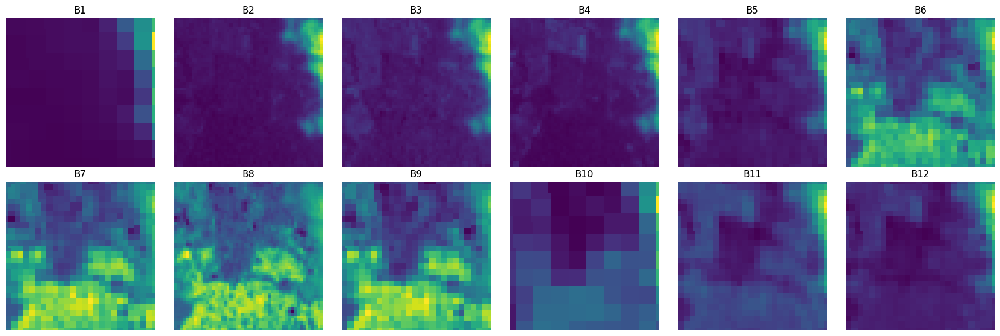

In [ ]:
def get_band_image(band, ID, month):
    df_slice = px_df[(px_df.ID == ID) & (px_df.month == month)]
    df_meta = image_meta_df[(image_meta_df.ID == ID) & (image_meta_df.month == month)]

    H = int(df_meta["height"].iloc[0])
    W = int(df_meta["width"].iloc[0])

    return df_slice[band].values.reshape(H, W)

# Bands to plot
bands = [f"B{i}" for i in range(1, 13)]  # B1–B12

# Figure setup: 2 rows × 6 columns
fig, axes = plt.subplots(2, 6, figsize=(18, 6))
axes = axes.flatten()

for ax, band in zip(axes, bands):
    img = get_band_image(band, "ID_000167", 3)
    ax.imshow(img)
    ax.set_title(band)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
unique_df = df.drop_duplicates(subset=["ID"], ignore_index=True)
feats_df = unique_df[["dstype", "ID", "Target"]].merge(agg_df, on=["ID"], how="left")
feats_df = feats_df.merge(vi_df, on=["ID"], how="left")

nan_cols = [col for col in feats_df.columns if feats_df[col].isnull().all()]
if nan_cols:
    feats_df = feats_df.drop(columns=nan_cols)
    logging.warning(f"Dropped {len(nan_cols)} all-NaN columns: {nan_cols}")

constant_cols = [col for col in feats_df.columns if feats_df[col].nunique(dropna=True) <= 1]
truly_constant_cols = []
for col in feats_df.columns:
    if feats_df[col].nunique(dropna=False) == 1:
        truly_constant_cols.append(col)
if truly_constant_cols:
    feats_df = feats_df.drop(columns=truly_constant_cols)
    logging.warning(
        f"Dropped {len(truly_constant_cols)} constant columns: {truly_constant_cols}"
    )
feats_df.head()

,dstype,ID,Target,B1_mean_month1,B1_median_month1,B1_min_month1,B1_max_month1,B1_kurtosis_month1,B1_skew_month1,B1_q25_month1,B1_q75_month1,B2_mean_month1,B2_median_month1,B2_min_month1,B2_max_month1,B2_kurtosis_month1,B2_skew_month1,B2_q25_month1,B2_q75_month1,B3_mean_month1,B3_median_month1,B3_min_month1,B3_max_month1,B3_kurtosis_month1,B3_skew_month1,B3_q25_month1,B3_q75_month1,B4_mean_month1,B4_median_month1,B4_min_month1,B4_max_month1,B4_kurtosis_month1,B4_skew_month1,B4_q25_month1,B4_q75_month1,B5_mean_month1,B5_median_month1,B5_min_month1,B5_max_month1,B5_kurtosis_month1,B5_skew_month1,B5_q25_month1,B5_q75_month1,B6_mean_month1,B6_median_month1,B6_min_month1,B6_max_month1,B6_kurtosis_month1,B6_skew_month1,B6_q25_month1,B6_q75_month1,B7_mean_month1,B7_median_month1,B7_min_month1,B7_max_month1,B7_kurtosis_month1,B7_skew_month1,B7_q25_month1,B7_q75_month1,B8_mean_month1,B8_median_month1,B8_min_month1,B8_max_month1,B8_kurtosis_month1,B8_skew_month1,B8_q25_month1,B8_q75_month1,B9_mean_month1,B9_median_month1,B9_min_month1,B9_max_month1,B9_kurtosis_month1,B9_skew_month1,B9_q25_month1,B9_q75_month1,B10_mean_month1,B10_median_month1,B10_min_month1,B10_max_month1,B10_kurtosis_month1,B10_skew_month1,B10_q25_month1,B10_q75_month1,B11_mean_month1,B11_median_month1,B11_min_month1,B11_max_month1,B11_kurtosis_month1,B11_skew_month1,B11_q25_month1,B11_q75_month1,B12_mean_month1,B12_median_month1,B12_min_month1,B12_max_month1,B12_kurtosis_month1,B12_skew_month1,B12_q25_month1,B12_q75_month1,B1_mean_month2,B1_median_month2,B1_min_month2,B1_max_month2,B1_kurtosis_month2,B1_skew_month2,B1_q25_month2,B1_q75_month2,B2_mean_month2,B2_median_month2,B2_min_month2,B2_max_month2,B2_kurtosis_month2,B2_skew_month2,B2_q25_month2,B2_q75_month2,B3_mean_month2,B3_median_month2,B3_min_month2,B3_max_month2,B3_kurtosis_month2,B3_skew_month2,B3_q25_month2,B3_q75_month2,B4_mean_month2,B4_median_month2,B4_min_month2,B4_max_month2,B4_kurtosis_month2,B4_skew_month2,B4_q25_month2,B4_q75_month2,B5_mean_month2,B5_median_month2,B5_min_month2,B5_max_month2,B5_kurtosis_month2,B5_skew_month2,B5_q25_month2,B5_q75_month2,B6_mean_month2,B6_median_month2,B6_min_month2,B6_max_month2,B6_kurtosis_month2,B6_skew_month2,B6_q25_month2,B6_q75_month2,B7_mean_month2,B7_median_month2,B7_min_month2,B7_max_month2,B7_kurtosis_month2,B7_skew_month2,B7_q25_month2,B7_q75_month2,B8_mean_month2,B8_median_month2,B8_min_month2,B8_max_month2,B8_kurtosis_month2,B8_skew_month2,B8_q25_month2,B8_q75_month2,B9_mean_month2,B9_median_month2,B9_min_month2,B9_max_month2,B9_kurtosis_month2,B9_skew_month2,B9_q25_month2,B9_q75_month2,B10_mean_month2,B10_median_month2,B10_min_month2,B10_max_month2,B10_kurtosis_month2,B10_skew_month2,B10_q25_month2,B10_q75_month2,B11_mean_month2,B11_median_month2,B11_min_month2,B11_max_month2,B11_kurtosis_month2,B11_skew_month2,B11_q25_month2,B11_q75_month2,B12_mean_month2,B12_median_month2,B12_min_month2,B12_max_month2,B12_kurtosis_month2,B12_skew_month2,B12_q25_month2,B12_q75_month2,B1_mean_month3,B1_median_month3,B1_min_month3,B1_max_month3,B1_kurtosis_month3,B1_skew_month3,B1_q25_month3,B1_q75_month3,B2_mean_month3,B2_median_month3,B2_min_month3,B2_max_month3,B2_kurtosis_month3,B2_skew_month3,B2_q25_month3,B2_q75_month3,B3_mean_month3,B3_median_month3,B3_min_month3,B3_max_month3,B3_kurtosis_month3,B3_skew_month3,B3_q25_month3,B3_q75_month3,B4_mean_month3,B4_median_month3,B4_min_month3,B4_max_month3,B4_kurtosis_month3,B4_skew_month3,B4_q25_month3,B4_q75_month3,B5_mean_month3,B5_median_month3,B5_min_month3,B5_max_month3,B5_kurtosis_month3,B5_skew_month3,B5_q25_month3,B5_q75_month3,B6_mean_month3,B6_median_month3,B6_min_month3,B6_max_month3,B6_kurtosis_month3,B6_skew_month3,B6_q25_month3,B6_q75_month3,B7_mean_month3,B7_median_month3,B7_min_month3,B7_max_month3,B7_kurtosis_month3,B7_skew_month3,B7_q25_month3,B7_q75_month3,B8_mean_month3,B8_median_month3,B8_min_month3,B8_max_month3,B8_kurtosis_month3,B8_skew_month3,B8_q25_month3,B8_q75_month3,B9_mean_month3,B9_median_month

In [ ]:
class_mapper = {y: x for x, y in enumerate(sorted(df[df.dstype == 'train'].Target.unique().tolist()))}
inverse_class_mapper = {v: k for k, v in class_mapper.items()}
class_mapper, inverse_class_mapper

({'Cocoa': 0, 'Palm': 1, 'Rubber': 2}, {0: 'Cocoa', 1: 'Palm', 2: 'Rubber'})

In [ ]:
train_df = feats_df[feats_df.dstype == "train"].reset_index(drop=True)
test_df = feats_df[feats_df.dstype == "test"].reset_index(drop=True)

train_df["Target"] = train_df["Target"].map(class_mapper)
test_df["Target"] = 0

train_df["fold"] = -1
skf = StratifiedKFold(n_splits=15, shuffle=True, random_state=11)
for fold, (train_idx, val_idx) in enumerate(skf.split(train_df, train_df["Target"]), 1):
    train_df.loc[val_idx, "fold"] = fold

train_df.groupby(["fold", 'Target']).size() # Folds have well balanced classes

test_df.set_index("ID", inplace=True)
ss.set_index("ID", inplace=True)
test_df = test_df.loc[ss.index]
test_df.reset_index(inplace=True)
display(ss.head())
display(test_df.head())

,Target
ID,
ID_731818,NaN
ID_790093,NaN
ID_931033,NaN
ID_079024,NaN
ID_691532,NaN


,ID,dstype,Target,B1_mean_month1,B1_median_month1,B1_min_month1,B1_max_month1,B1_kurtosis_month1,B1_skew_month1,B1_q25_month1,B1_q75_month1,B2_mean_month1,B2_median_month1,B2_min_month1,B2_max_month1,B2_kurtosis_month1,B2_skew_month1,B2_q25_month1,B2_q75_month1,B3_mean_month1,B3_median_month1,B3_min_month1,B3_max_month1,B3_kurtosis_month1,B3_skew_month1,B3_q25_month1,B3_q75_month1,B4_mean_month1,B4_median_month1,B4_min_month1,B4_max_month1,B4_kurtosis_month1,B4_skew_month1,B4_q25_month1,B4_q75_month1,B5_mean_month1,B5_median_month1,B5_min_month1,B5_max_month1,B5_kurtosis_month1,B5_skew_month1,B5_q25_month1,B5_q75_month1,B6_mean_month1,B6_median_month1,B6_min_month1,B6_max_month1,B6_kurtosis_month1,B6_skew_month1,B6_q25_month1,B6_q75_month1,B7_mean_month1,B7_median_month1,B7_min_month1,B7_max_month1,B7_kurtosis_month1,B7_skew_month1,B7_q25_month1,B7_q75_month1,B8_mean_month1,B8_median_month1,B8_min_month1,B8_max_month1,B8_kurtosis_month1,B8_skew_month1,B8_q25_month1,B8_q75_month1,B9_mean_month1,B9_median_month1,B9_min_month1,B9_max_month1,B9_kurtosis_month1,B9_skew_month1,B9_q25_month1,B9_q75_month1,B10_mean_month1,B10_median_month1,B10_min_month1,B10_max_month1,B10_kurtosis_month1,B10_skew_month1,B10_q25_month1,B10_q75_month1,B11_mean_month1,B11_median_month1,B11_min_month1,B11_max_month1,B11_kurtosis_month1,B11_skew_month1,B11_q25_month1,B11_q75_month1,B12_mean_month1,B12_median_month1,B12_min_month1,B12_max_month1,B12_kurtosis_month1,B12_skew_month1,B12_q25_month1,B12_q75_month1,B1_mean_month2,B1_median_month2,B1_min_month2,B1_max_month2,B1_kurtosis_month2,B1_skew_month2,B1_q25_month2,B1_q75_month2,B2_mean_month2,B2_median_month2,B2_min_month2,B2_max_month2,B2_kurtosis_month2,B2_skew_month2,B2_q25_month2,B2_q75_month2,B3_mean_month2,B3_median_month2,B3_min_month2,B3_max_month2,B3_kurtosis_month2,B3_skew_month2,B3_q25_month2,B3_q75_month2,B4_mean_month2,B4_median_month2,B4_min_month2,B4_max_month2,B4_kurtosis_month2,B4_skew_month2,B4_q25_month2,B4_q75_month2,B5_mean_month2,B5_median_month2,B5_min_month2,B5_max_month2,B5_kurtosis_month2,B5_skew_month2,B5_q25_month2,B5_q75_month2,B6_mean_month2,B6_median_month2,B6_min_month2,B6_max_month2,B6_kurtosis_month2,B6_skew_month2,B6_q25_month2,B6_q75_month2,B7_mean_month2,B7_median_month2,B7_min_month2,B7_max_month2,B7_kurtosis_month2,B7_skew_month2,B7_q25_month2,B7_q75_month2,B8_mean_month2,B8_median_month2,B8_min_month2,B8_max_month2,B8_kurtosis_month2,B8_skew_month2,B8_q25_month2,B8_q75_month2,B9_mean_month2,B9_median_month2,B9_min_month2,B9_max_month2,B9_kurtosis_month2,B9_skew_month2,B9_q25_month2,B9_q75_month2,B10_mean_month2,B10_median_month2,B10_min_month2,B10_max_month2,B10_kurtosis_month2,B10_skew_month2,B10_q25_month2,B10_q75_month2,B11_mean_month2,B11_median_month2,B11_min_month2,B11_max_month2,B11_kurtosis_month2,B11_skew_month2,B11_q25_month2,B11_q75_month2,B12_mean_month2,B12_median_month2,B12_min_month2,B12_max_month2,B12_kurtosis_month2,B12_skew_month2,B12_q25_month2,B12_q75_month2,B1_mean_month3,B1_median_month3,B1_min_month3,B1_max_month3,B1_kurtosis_month3,B1_skew_month3,B1_q25_month3,B1_q75_month3,B2_mean_month3,B2_median_month3,B2_min_month3,B2_max_month3,B2_kurtosis_month3,B2_skew_month3,B2_q25_month3,B2_q75_month3,B3_mean_month3,B3_median_month3,B3_min_month3,B3_max_month3,B3_kurtosis_month3,B3_skew_month3,B3_q25_month3,B3_q75_month3,B4_mean_month3,B4_median_month3,B4_min_month3,B4_max_month3,B4_kurtosis_month3,B4_skew_month3,B4_q25_month3,B4_q75_month3,B5_mean_month3,B5_median_month3,B5_min_month3,B5_max_month3,B5_kurtosis_month3,B5_skew_month3,B5_q25_month3,B5_q75_month3,B6_mean_month3,B6_median_month3,B6_min_month3,B6_max_month3,B6_kurtosis_month3,B6_skew_month3,B6_q25_month3,B6_q75_month3,B7_mean_month3,B7_median_month3,B7_min_month3,B7_max_month3,B7_kurtosis_month3,B7_skew_month3,B7_q25_month3,B7_q75_month3,B8_mean_month3,B8_median_month3,B8_min_month3,B8_max_month3,B8_kurtosis_month3,B8_skew_month3,B8_q25_month3,B8_q75_month3,B9_mean_month3,B9_median_month

In [ ]:
train_df.shape, test_df.shape

((953, 10780), (282, 10779))

In [ ]:
train_drop_cols = ["ID", "dstype", 'fold', 'Target']
test_drop_cols = ["ID", "dstype", "Target"]

X_train = train_df[train_df.fold != 13].reset_index(drop=True)
X_val = train_df[train_df.fold == 13].reset_index(drop=True)
X_test = test_df.copy()

y_train = X_train["Target"]
y_val = X_val["Target"]

X_train = X_train.drop(columns=train_drop_cols)
X_val = X_val.drop(columns=train_drop_cols)
X_test = X_test.drop(columns=test_drop_cols)

probs_df = test_df[['ID']].copy()
depths = [3,7,15,17]
n_estimators = [56,10000,10000,10000]

for depth, n_estimator in zip(depths, n_estimators):
    lgb_params = dict(
            objective="multiclass",
            num_class=3,
            boosting_type="gbdt",
            n_estimators=n_estimator,
            random_state=11,
            early_stopping_rounds=1000,
            verbose=-1,
            device_type="cpu",
            class_weight="balanced",
            subsample=0.8,
            colsample_bytree=0.8,
            max_depth=depth,
        )
    model = lgb.LGBMClassifier(**lgb_params)

    model.fit(
        X_train,
        y_train,
        eval_set=[(X_val, y_val)],
        eval_metric="multi_logloss",

    )

    # Validation score
    y_probs_val = model.predict_proba(X_val)
    y_preds_val = np.argmax(y_probs_val, axis=1)
    f1 = f1_score(y_val, y_preds_val, average="macro")
    print(f"F1 Score: {f1:.4f} for depth: {depth}")

    # Test set predictions
    y_probs_test = model.predict_proba(X_test)
    max_probs = y_probs_test.max(axis=1)
    entropies = entropy(y_probs_test.T)  # Transpose to shape (num_classes, num_samples)
    preds = np.argmax(y_probs_test, axis=1)

    sorted_probs = np.sort(y_probs_test, axis=1)
    margins = sorted_probs[:, -1] - sorted_probs[:, -2]

    # Add features for pseudo-label filtering
    probs_df[f'lgb_probs_d{depth}'] = max_probs
    probs_df[f'lgb_entropy_d{depth}'] = entropies
    probs_df[f'lgb_pred_d{depth}'] = preds
    probs_df[f'lgb_margin_d{depth}'] = margins
    y_probs = model.predict_proba(X_val)
    y_preds = np.argmax(y_probs, axis=1)
    f1 = f1_score(y_val, y_preds, average="macro")

    X_test_probs = model.predict_proba(X_test)
    probs_df[f'lgb_probs_d{depth}'] = X_test_probs.max(1)

probs_df.head() # The F1 scores below show that using a low depth avoids overfitting and produces the best f1 score

F1 Score: 0.9545 for depth: 3
F1 Score: 0.9357 for depth: 7
F1 Score: 0.9357 for depth: 15
F1 Score: 0.9357 for depth: 17


,ID,lgb_probs_d3,lgb_entropy_d3,lgb_pred_d3,lgb_margin_d3,lgb_probs_d7,lgb_entropy_d7,lgb_pred_d7,lgb_margin_d7,lgb_probs_d15,lgb_entropy_d15,lgb_pred_d15,lgb_margin_d15,lgb_probs_d17,lgb_entropy_d17,lgb_pred_d17,lgb_margin_d17
0,ID_731818,0.903,0.333,1,0.808,0.976,0.117,1,0.954,0.963,0.171,1,0.929,0.946,0.226,1,0.895
1,ID_790093,0.943,0.226,1,0.888,0.993,0.045,1,0.986,0.987,0.074,1,0.975,0.984,0.087,1,0.969
2,ID_931033,0.993,0.045,2,0.988,0.998,0.013,2,0.997,0.995,0.033,2,0.992,0.996,0.028,2,0.994
3,ID_079024,0.982,0.093,2,0.966,0.998,0.012,2,0.997,0.997,0.023,2,0.995,0.997,0.021,2,0.995
4,ID_691532,0.984,0.088,2,0.968,0.998,0.013,2,0.997,0.996,0.028,2,0.993,0.997,0.019,2,0.996


In [ ]:
# Noisy misclassifications due to limited data and noisy labels
# Based on validation tests and experimentation, exact entropies can point to exact classifications and miscalssifications.
# This might be due to clouds in bands that have specific patterns across classes

# Entropies which should be mapped to class 0
class0_entropies = [0.3928934402323657, 0.37274909950819307, 0.7881616752758822]
probs_df.loc[probs_df.lgb_entropy_d3.isin(class0_entropies), "lgb_pred_d3"] = 0

# Entropies which should be mapped to class 1
class1_entropies = [0.7175574832523829,0.7753925663340739,0.6516693978908501,0.6040582048053773,0.7236428337400949,0.2309718992658923,
                    0.37168407861000624]
probs_df.loc[probs_df.lgb_entropy_d3.isin(class1_entropies), "lgb_pred_d3"] = 1

# Entropies which should be mapped to class 2
class2_entropies = values = [0.7164384417778991,0.1720037389640236,0.17785184570303092,0.5416916717717332,0.710091308033215,0.39062204683185825,\
0.4113944592358955,0.1661745901843656,0.5984367849959698,0.2786264435454856,0.3853576383465001,0.7328528954881173,0.3987754889300057,0.6785306140052942,\
0.3198516694783604,0.2382940720895359,0.5325498855237791,0.44743289394279173,0.4426361644836454,0.5921647643167715,0.3548675276749744]

probs_df.loc[probs_df.lgb_entropy_d3.isin(class2_entropies), "lgb_pred_d3"] = 2

In [ ]:
s2_npy_df.head()

,npy_path,ID,month,dstype,height,width,Target,ID2
0,/content/npy_images/ID_000167_1.npy,ID_000167,1,test,51,51,NaN,ID_000167_1
1,/content/npy_images/ID_000167_2.npy,ID_000167,2,test,51,51,NaN,ID_000167_2
2,/content/npy_images/ID_000167_3.npy,ID_000167,3,test,51,51,NaN,ID_000167_3
3,/content/npy_images/ID_000167_4.npy,ID_000167,4,test,51,51,NaN,ID_000167_4
4,/content/npy_images/ID_000167_7.npy,ID_000167,7,test,51,51,NaN,ID_000167_7


In [ ]:
def normalize_df_sklearn(df, exclude_cols=["ID"]):
    df = df.copy()
    df = df.fillna(999999)  # Fill NaNs with a large value
    scaler = MinMaxScaler()
    cols_to_scale = [col for col in df.columns if col not in exclude_cols]
    df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])
    return df


vi_df_norm = normalize_df_sklearn(vi_df)
agg_df_norm = normalize_df_sklearn(agg_df)


class ByteDataset(Dataset):
    def __init__(self, df, agg_df=None, vi_df=None, mode="train", transforms=None):
        self.df = df.reset_index(drop=True)
        self.mode = mode
        self.transforms = transforms
        self.ids = df["ID"].unique().tolist()
        self.df_by_id = df.groupby("ID")

        self.agg_df = agg_df.set_index("ID") if agg_df is not None else None
        self.vi_df = vi_df.set_index("ID") if vi_df is not None else None

    def __len__(self):
        return len(self.ids)

    def _normalize_per_band(self, x):
        for i in range(x.shape[0]):
            band = x[i]
            bmin, bmax = band.min(), band.max()
            if bmax - bmin > 1e-5:
                x[i] = (band - bmin) / (bmax - bmin)
            else:
                x[i] = 0
        return x

    def __getitem__(self, idx):
        ID = self.ids[idx]
        group = self.df_by_id.get_group(ID)
        month_map = dict(zip(group["month"], group["npy_path"]))

        img_stack = []
        for month in range(1, 13):
            if month in month_map:
                img = np.load(month_map[month]).astype(np.float32)  # (12, H, W)
            else:
                img = np.zeros((12, 64, 64), dtype=np.float32)

            resized = np.stack(
                [
                    cv2.resize(band, (64, 64), interpolation=cv2.INTER_LINEAR)
                    for band in img
                ]
            )
            img_stack.append(resized)

        full_img = np.concatenate(img_stack, axis=0)  # (144, 64, 64)
        full_img = self._normalize_per_band(full_img)
        full_img = np.transpose(full_img, (1, 2, 0))  # (64, 64, 144)

        if self.transforms:
            full_img = self.transforms(image=full_img)["image"]

        target = group["Target"].values[0]

        # Extract normalized tabular features
        vi_feat = (
            self.vi_df.loc[ID].values.astype(np.float32)
            if self.vi_df is not None
            else np.array([])
        )
        agg_feat = (
            self.agg_df.loc[ID].values.astype(np.float32)
            if self.agg_df is not None
            else np.array([])
        )

        tabular_feat = (
            np.concatenate([vi_feat, agg_feat])
            if vi_feat.size and agg_feat.size
            else None
        )

        return {
            "ID": ID,
            "img": full_img,
            "target": target,
            "tabular": tabular_feat,
        }


class ByteDataModule(pl.LightningDataModule):
    def __init__(
        self,
        train_df,
        val_df,
        test_df,
        agg_df,
        vi_df,
        train_transforms,
        val_transdforms,
        cfg=None,
    ):
        super().__init__()

        self.train_df = train_df.reset_index(drop=True)
        self.val_df = val_df.reset_index(drop=True)
        self.test_df = test_df.reset_index(drop=True)
        self.agg_df = agg_df.reset_index(drop=True)
        self.vi_df = vi_df.reset_index(drop=True)
        self.train_transforms = train_transforms
        self.val_transforms = val_transdforms
        self.cfg = cfg

    def train_dataloader(self):
        train_dataset = ByteDataset(
            self.train_df,
            agg_df=self.agg_df,
            vi_df=self.vi_df,
            mode="train",
            transforms=self.train_transforms,
        )
        return DataLoader(train_dataset, **self.cfg.data_loader.train)

    def val_dataloader(self):
        val_dataset = ByteDataset(
            self.val_df,
            agg_df=self.agg_df,
            vi_df=self.vi_df,
            mode="val",
            transforms=self.val_transforms,
        )
        return DataLoader(val_dataset, **self.cfg.data_loader.val)

    def predict_dataloader(self):
        test_dataset = ByteDataset(
            self.test_df,
            agg_df=self.agg_df,
            vi_df=self.vi_df,
            mode="test",
            transforms=self.val_transforms,
        )
        return DataLoader(test_dataset, **self.cfg.data_loader.val)


class ByteClassifier(nn.Module):
    def __init__(
        self,
        num_classes=3,
        in_chans=144,
        tabular_dim=None,
        backbone_name="convnext_large.fb_in22k_ft_in1k",
        dropout_rate=0.3,
    ):
        super().__init__()
        self.use_tabular = tabular_dim is not None

        self.backbone = timm.create_model(
            backbone_name,
            pretrained=True,
            num_classes=0,
            in_chans=in_chans,
        )
        in_features = self.backbone.num_features

        if self.use_tabular:
            self.tabular_proj = nn.Sequential(
                nn.LayerNorm(tabular_dim),
                nn.Linear(tabular_dim, in_features),
                nn.GELU(),
            )
            fusion_dim = in_features * 2
        else:
            fusion_dim = in_features

        self.head = nn.Sequential(
            nn.LayerNorm(fusion_dim),
            nn.Dropout(p=dropout_rate),
            nn.Linear(fusion_dim, fusion_dim // 2),
            nn.GELU(),
            nn.Dropout(p=dropout_rate),
            nn.Linear(fusion_dim // 2, num_classes),
        )

        self._init_weights()

    def _init_weights(self):
        nn.init.xavier_uniform_(self.head[-1].weight)
        nn.init.constant_(self.head[-1].bias, 0)

    def forward(self, x_img, x_tabular=None):
        x = self.backbone(x_img)  # (B, F)

        if self.use_tabular and x_tabular is not None:
            x_tab = self.tabular_proj(x_tabular)  # (B, F)
            x = torch.cat([x, x_tab], dim=1)  # (B, 2F)

        x = self.head(x)  # (B, num_classes)
        return x


class ByteLit(pl.LightningModule):
    def __init__(
        self,
        backbone="convnext_large.fb_in22k_ft_in1k",
        in_chans=12,
        lr=1e-3,
        num_classes=3,
        dropout_rate=0.2,
    ):
        super().__init__()
        self.save_hyperparameters()
        self.model = ByteClassifier(
            dropout_rate=dropout_rate,
            num_classes=num_classes,
            in_chans=in_chans,
            backbone_name=backbone,
        )
        self.lr = lr
        self.criterion = nn.CrossEntropyLoss()
        self.val_f1 = MulticlassF1Score(num_classes=num_classes, average="macro")
        self.train_f1 = MulticlassF1Score(num_classes=num_classes, average="macro")

    def forward(self, batch):
        x = batch["img"]
        tabular = batch["tabular"]
        return self.model(x, tabular)

    def training_step(self, batch, _):
        x, y, tabular = batch["img"], batch["target"], batch["tabular"]
        logits = self(batch)
        loss = self.criterion(logits, y)

        f1 = self.train_f1(logits.softmax(dim=-1), y)

        self.log(
            "train_loss",
            loss,
            on_step=True,
            on_epoch=True,
            prog_bar=True,
            sync_dist=True,
        )
        self.log(
            "train_f1",
            f1,
            on_step=True,
            on_epoch=True,
            prog_bar=True,
            sync_dist=True,
        )

        return loss

    def validation_step(self, batch, _):
        x, y, tabular = batch["img"], batch["target"], batch["tabular"]
        logits = self(batch)
        loss = self.criterion(logits, y)

        f1 = self.val_f1(logits.softmax(dim=-1), y)

        self.log(
            "val_loss",
            loss,
            on_step=False,
            on_epoch=True,
            prog_bar=True,
            sync_dist=True,
        )
        self.log(
            "val_f1",
            f1,
            on_step=False,
            on_epoch=True,
            prog_bar=True,
            sync_dist=True,
        )
    def predict_step(self, batch, batch_idx, dataloader_idx=0):
        logits = self(batch)
        ids = batch["ID"]
        preds = logits.argmax(dim=1)
        return {"ID": ids, "Target": preds.cpu()}



    def configure_optimizers(self):
        opt = AdamW(self.parameters(), lr=self.lr, weight_decay=1e-3)
        # sch = ExponentialLR(opt, gamma=0.95)
        return {
            "optimizer": opt,
            # "lr_scheduler": sch,
        }

def seed_everything(seed: int = 42) -> None:
    os.environ["PYTHONHASHSEED"] = str(seed)
    os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.use_deterministic_algorithms(True)
    pl.seed_everything(seed, workers=True)


# --- CONFIG ---
config = Box(auto_box=True, default_box=True)
config.seed = 123
seed_everything(config.seed)
torch.set_float32_matmul_precision("medium")
torch.backends.cuda.matmul.allow_tf32 = True
torch.backends.cudnn.allow_tf32 = True

# Trainer
config.trainer.devices = 1
config.trainer.strategy = "auto"
config.trainer.precision = "32-true"
config.trainer.max_epochs = 76 #76
config.trainer.accumulate_grad_batches = 1
config.trainer.num_sanity_val_steps = 0
config.trainer.deterministic = True
config.trainer.benchmark = False

# Train DataLoader
config.data_loader.train.batch_size = 16
config.data_loader.train.num_workers = 12
config.data_loader.train.prefetch_factor = 2
config.data_loader.train.shuffle = True
config.data_loader.train.drop_last = False
config.data_loader.train.pin_memory = True
config.data_loader.train.persistent_workers = True
config.data_loader.train.pin_memory_device = "cuda"

# Validation DataLoader
config.data_loader.val.batch_size = 32
config.data_loader.val.num_workers = 12
config.data_loader.val.prefetch_factor = 2
config.data_loader.val.shuffle = False
config.data_loader.val.drop_last = False
config.data_loader.val.pin_memory = True
config.data_loader.val.persistent_workers = True

# Model
config.model.lr = 1e-4
config.model.backbone = "convnext_small.fb_in22k_ft_in1k"  # convnext_large.fb_in22k_ft_in1k convnext_small.fb_in22k_ft_in1k
config.model.in_chans = 144
config.model.num_classes = 3
config.model.dropout_rate = 0.3

config.exp_name = "final_sub"

train_transforms = A.Compose(
    [
        A.Resize(64, 64),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        # A.Transpose(p=0.5),
        A.RandomRotate90(p=0.5),
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=30, p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.GaussianBlur(p=0.2),
        ToTensorV2(),
    ],
    p=1.0,
    seed=config.seed,
)

val_transforms = A.Compose([A.Resize(64, 64), ToTensorV2()], p=1.0, seed=config.seed)

train_dff = s2_npy_df[s2_npy_df.ID.isin(train_df[train_df.fold != 13].ID)]
val_dff = s2_npy_df[s2_npy_df.ID.isin(train_df[train_df.fold == 13].ID)]
test_dff = s2_npy_df[s2_npy_df.ID.isin(test_df.ID)]

# Sort test_dff to follow the ID order in ss.index, preserving all duplicate rows
test_dff["ID"] = test_dff["ID"].astype(str)
id_order = pd.Series(range(len(ss.index)), index=ss.index.astype(str))
test_dff["__order"] = test_dff["ID"].map(id_order)
test_dff = test_dff.sort_values("__order").drop(columns="__order").reset_index(drop=True)


train_dff["Target"] = train_dff["Target"].map(class_mapper)
val_dff["Target"] = val_dff["Target"].map(class_mapper)

pseudo_df = test_df.copy()
pseudo_df = s2_npy_df[s2_npy_df.ID.isin(pseudo_df.ID)]
pseudo_df["Target"] = pseudo_df["ID"].map(
    {x: y for x, y in zip(probs_df.ID, probs_df.lgb_pred_d3.values)}
)

train_dff = pd.concat([train_dff, pseudo_df], ignore_index=True)

display(train_dff.head(10))
display(test_dff.head(10))

datamodule = ByteDataModule(
    train_df=train_dff,
    val_df=val_dff,
    test_df=test_dff,
    agg_df=agg_df_norm,
    vi_df=vi_df_norm,
    train_transforms=train_transforms,
    val_transdforms=val_transforms,
    cfg=config,
)

model = ByteLit(**config.model)

lr_monitor = pl.callbacks.LearningRateMonitor(
    logging_interval="step", log_momentum=False, log_weight_decay=False
)
early_stop_callback = pl.callbacks.EarlyStopping(
    monitor="val_f1", min_delta=0.00, patience=50, verbose=True, mode="max"
)

MODEL_SAVE_PATH = str(Path("outputs/checkpoints")) + os.sep + config["exp_name"]
Path(MODEL_SAVE_PATH).mkdir(parents=True, exist_ok=True)

model_checkpoint = pl.callbacks.ModelCheckpoint(
    dirpath=MODEL_SAVE_PATH,
    monitor="val_f1",
    mode="max",
    save_weights_only=False,
    save_last=True,
    save_top_k=100,
    filename="model-{epoch}-{val_loss:.4f}-{val_f1:.4f}-{train_f1:.4f}",
)

trainer = pl.Trainer(
    **config.trainer,
    callbacks=[model_checkpoint, lr_monitor, early_stop_callback],
)

trainer.fit(model, datamodule=datamodule)

INFO:lightning_fabric.utilities.seed:Seed set to 123


,npy_path,ID,month,dstype,height,width,Target,ID2
0,/content/npy_images/ID_059i1w_1.npy,ID_059i1w,1,train,51,51,1,ID_059i1w_1
1,/content/npy_images/ID_059i1w_2.npy,ID_059i1w,2,train,51,51,1,ID_059i1w_2
2,/content/npy_images/ID_059i1w_3.npy,ID_059i1w,3,train,51,51,1,ID_059i1w_3
3,/content/npy_images/ID_059i1w_4.npy,ID_059i1w,4,train,51,51,1,ID_059i1w_4
4,/content/npy_images/ID_059i1w_7.npy,ID_059i1w,7,train,51,51,1,ID_059i1w_7
5,/content/npy_images/ID_059i1w_11.npy,ID_059i1w,11,train,51,51,1,ID_059i1w_11
6,/content/npy_images/ID_059i1w_12.npy,ID_059i1w,12,train,51,51,1,ID_059i1w_12
7,/content/npy_images/ID_0612VR_1.npy,ID_0612VR,1,train,51,51,1,ID_0612VR_1
8,/content/npy_images/ID_0612VR_2.npy,ID_0612VR,2,train,51,51,1,ID_0612VR_2
9,/content/npy_images/ID_0612VR_3.npy,ID_0612VR,3,train,51,51,1,ID_0612VR_3


,npy_path,ID,month,dstype,height,width,Target,ID2
0,/content/npy_images/ID_731818_11.npy,ID_731818,11,test,51,52,NaN,ID_731818_11
1,/content/npy_images/ID_731818_4.npy,ID_731818,4,test,51,52,NaN,ID_731818_4
2,/content/npy_images/ID_731818_7.npy,ID_731818,7,test,51,52,NaN,ID_731818_7
3,/content/npy_images/ID_731818_12.npy,ID_731818,12,test,52,51,NaN,ID_731818_12
4,/content/npy_images/ID_731818_3.npy,ID_731818,3,test,51,52,NaN,ID_731818_3
5,/content/npy_images/ID_731818_1.npy,ID_731818,1,test,52,51,NaN,ID_731818_1
6,/content/npy_images/ID_731818_2.npy,ID_731818,2,test,52,51,NaN,ID_731818_2
7,/content/npy_images/ID_790093_1.npy,ID_790093,1,test,51,51,NaN,ID_790093_1
8,/content/npy_images/ID_790093_7.npy,ID_790093,7,test,51,51,NaN,ID_790093_7
9,/content/npy_images/ID_790093_4.npy,ID_790093,4,test,51,51,NaN,ID_790093_4


model.safetensors:   0%|          | 0.00/201M [00:00<?, ?B/s]

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type              | Params | Mode 
--------------------------------------------------------
0 | model     | ByteClassifier    | 50.0 M | train
1 | criterion | CrossEntropyLoss  | 0      | train
2 | val_f1    | MulticlassF1Score | 0      | train
3 | train_f1  | MulticlassF1Score | 0      | train
--------------------------------------------------------
50.0 M    Trainable params
0         Non-trainable params
50.0 M    Total params
199.877   Total estimated model params size (MB)
476       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved. New best score: 0.686


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.015 >= min_delta = 0.0. New best score: 0.701


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.005 >= min_delta = 0.0. New best score: 0.706


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.012 >= min_delta = 0.0. New best score: 0.718


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.050 >= min_delta = 0.0. New best score: 0.768


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.004 >= min_delta = 0.0. New best score: 0.772


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.020 >= min_delta = 0.0. New best score: 0.791


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.002 >= min_delta = 0.0. New best score: 0.794


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.006 >= min_delta = 0.0. New best score: 0.800


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.037 >= min_delta = 0.0. New best score: 0.837


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.024 >= min_delta = 0.0. New best score: 0.861


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.034 >= min_delta = 0.0. New best score: 0.895


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.037 >= min_delta = 0.0. New best score: 0.932


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_f1 improved by 0.046 >= min_delta = 0.0. New best score: 0.978


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=76` reached.


In [ ]:
# Make predictions
pred_outputs = trainer.predict(model, datamodule=datamodule)

all_ids = []
all_preds = []

for batch in pred_outputs:
    all_ids.extend(batch["ID"])
    all_preds.extend(batch["Target"].tolist())

sub = pd.DataFrame({"ID": all_ids, "Target": all_preds})
sub.Target = sub.Target.map(inverse_class_mapper)
display(sub.head())
display(sub.Target.value_counts())
sub.to_csv("final_submission.csv", index=False)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

,ID,Target
0,ID_731818,Palm
1,ID_790093,Palm
2,ID_931033,Rubber
3,ID_079024,Rubber
4,ID_691532,Rubber


,count
Target,
Rubber,125
Palm,100
Cocoa,57


In [ ]:
end_time = time.time()
elapsed = end_time - start_time

mins, secs = divmod(elapsed, 60)
print(f"Notebook runtime: {int(mins)} min {secs:.2f} sec")

Notebook runtime: 33 min 13.55 sec
